In [1]:
import pandas as pd
#from pycaret.classification import *
#from pycaret.clustering import *
%matplotlib inline
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.signal import find_peaks
import warnings
import plotly.express as px

In [2]:
x_train = pd.read_csv("C:/Users/chags/Downloads/ANNOTATIONS/ANNOTATIONS/PIL004_CUET1_A1.csv")
val = pd.read_csv("C:/Users/chags/Downloads/ANNOTATIONS/ANNOTATIONS/PIL004_CUET2_A2.csv")

In [3]:
def feature_extract(data, window_size, step_size):
    warnings.filterwarnings('ignore')
    df_train = data
        
    df_train['x'] = x_train['Accelerometer X']
    df_train['y']= x_train['Accelerometer Y']
    df_train['z']= x_train['Accelerometer Z']
    df_train['activity'] = df_train['anno_key']
    df_train = df_train[['x', 'y', 'z', 'activity']]
    x_list = []
    y_list = []
    z_list = []
    train_labels = []

    window_size = window_size #100
    step_size = step_size #50

    # creating overlaping windows of size window-size 100
    for i in range(0, df_train.shape[0] - window_size, step_size):
        xs = df_train['x'].values[i: i + 100]
        ys = df_train['y'].values[i: i + 100]
        zs = df_train['z'].values[i: i + 100]
        label = stats.mode(df_train['activity'][i: i + 100])[0][0]

        x_list.append(xs)
        y_list.append(ys)
        z_list.append(zs)
        train_labels.append(label)

    # Statistical Features on raw x, y and z in time domain
    X_train = pd.DataFrame()
    print("Starting feature extraction...")

    # mean
    X_train['accx_mean'] = pd.Series(x_list).apply(lambda x: x.mean())
    X_train['accy_mean'] = pd.Series(y_list).apply(lambda x: x.mean())
    X_train['accz_mean'] = pd.Series(z_list).apply(lambda x: x.mean())
    print('Mean...')

    # std dev
    X_train['accx_std'] = pd.Series(x_list).apply(lambda x: x.std())
    X_train['accy_std'] = pd.Series(y_list).apply(lambda x: x.std())
    X_train['accz_std'] = pd.Series(z_list).apply(lambda x: x.std())
    print('Std...')

    # avg absolute diff
    X_train['accx_aad'] = pd.Series(x_list).apply(lambda x: np.mean(np.absolute(x - np.mean(x))))
    X_train['accy_aad'] = pd.Series(y_list).apply(lambda x: np.mean(np.absolute(x - np.mean(x))))
    X_train['accz_aad'] = pd.Series(z_list).apply(lambda x: np.mean(np.absolute(x - np.mean(x))))
    print('Avg abs diff...')

    # min
    X_train['accx_min'] = pd.Series(x_list).apply(lambda x: x.min())
    X_train['accy_min'] = pd.Series(y_list).apply(lambda x: x.min())
    X_train['accz_min'] = pd.Series(z_list).apply(lambda x: x.min())
    print('Min...')

    # max
    X_train['accx_max'] = pd.Series(x_list).apply(lambda x: x.max())
    X_train['accy_max'] = pd.Series(y_list).apply(lambda x: x.max())
    X_train['accz_max'] = pd.Series(z_list).apply(lambda x: x.max())
    print('Max...')

    # max-min diff
    X_train['accx_maxmin_diff'] = X_train['accx_max'] - X_train['accx_min']
    X_train['accy_maxmin_diff'] = X_train['accy_max'] - X_train['accy_min']
    X_train['accz_maxmin_diff'] = X_train['accz_max'] - X_train['accz_min']
    print('max-min diff...')

    # median
    X_train['accx_median'] = pd.Series(x_list).apply(lambda x: np.median(x))
    X_train['accy_median'] = pd.Series(y_list).apply(lambda x: np.median(x))
    X_train['accz_median'] = pd.Series(z_list).apply(lambda x: np.median(x))
    print('median...')

    # median abs dev 
    X_train['accx_mad'] = pd.Series(x_list).apply(lambda x: np.median(np.absolute(x - np.median(x))))
    X_train['accy_mad'] = pd.Series(y_list).apply(lambda x: np.median(np.absolute(x - np.median(x))))
    X_train['accz_mad'] = pd.Series(z_list).apply(lambda x: np.median(np.absolute(x - np.median(x))))
    print('median abs dev ...')

    # interquartile range
    X_train['accx_IQR'] = pd.Series(x_list).apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25))
    X_train['accy_IQR'] = pd.Series(y_list).apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25))
    X_train['accz_IQR'] = pd.Series(z_list).apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25))
    print('interquartile range...')

    # negtive count
    X_train['accx_neg_count'] = pd.Series(x_list).apply(lambda x: np.sum(x < 0))
    X_train['accy_neg_count'] = pd.Series(y_list).apply(lambda x: np.sum(x < 0))
    X_train['accz_neg_count'] = pd.Series(z_list).apply(lambda x: np.sum(x < 0))
    print('negtive count...')

    # positive count
    X_train['accx_pos_count'] = pd.Series(x_list).apply(lambda x: np.sum(x > 0))
    X_train['accy_pos_count'] = pd.Series(y_list).apply(lambda x: np.sum(x > 0))
    X_train['accz_pos_count'] = pd.Series(z_list).apply(lambda x: np.sum(x > 0))
    print('positive count...')

    # values above mean
    X_train['accx_above_mean'] = pd.Series(x_list).apply(lambda x: np.sum(x > x.mean()))
    X_train['accy_above_mean'] = pd.Series(y_list).apply(lambda x: np.sum(x > x.mean()))
    X_train['accz_above_mean'] = pd.Series(z_list).apply(lambda x: np.sum(x > x.mean()))
    print('values above mean...')

    # number of peaks
    X_train['accx_peak_count'] = pd.Series(x_list).apply(lambda x: len(find_peaks(x)[0]))
    X_train['accy_peak_count'] = pd.Series(y_list).apply(lambda x: len(find_peaks(x)[0]))
    X_train['accz_peak_count'] = pd.Series(z_list).apply(lambda x: len(find_peaks(x)[0]))
    print('number of peaks...')

    # skewness
    X_train['accx_skewness'] = pd.Series(x_list).apply(lambda x: stats.skew(x))
    X_train['accy_skewness'] = pd.Series(y_list).apply(lambda x: stats.skew(x))
    X_train['accz_skewness'] = pd.Series(z_list).apply(lambda x: stats.skew(x))
    print('skewness...')

    # kurtosis
    X_train['accx_kurtosis'] = pd.Series(x_list).apply(lambda x: stats.kurtosis(x))
    X_train['accy_kurtosis'] = pd.Series(y_list).apply(lambda x: stats.kurtosis(x))
    X_train['accz_kurtosis'] = pd.Series(z_list).apply(lambda x: stats.kurtosis(x))
    print('kurtosis...')

    # energy
    X_train['accx_energy'] = pd.Series(x_list).apply(lambda x: np.sum(x**2)/100)
    X_train['accy_energy'] = pd.Series(y_list).apply(lambda x: np.sum(x**2)/100)
    X_train['accz_energy'] = pd.Series(z_list).apply(lambda x: np.sum(x**2/100))
    print('energy...')

    # avg resultant
    X_train['avg_result_accl'] = [i.mean() for i in ((pd.Series(x_list)**2 + pd.Series(y_list)**2 + pd.Series(z_list)**2)**0.5)]
    print('avg resultant...')
    

    # signal magnitude area
    X_train['acc_sma'] =    pd.Series(x_list).apply(lambda x: np.sum(abs(x)/100)) + pd.Series(y_list).apply(lambda x: np.sum(abs(x)/100)) \
                  + pd.Series(z_list).apply(lambda x: np.sum(abs(x)/100))
    print('signal magnitude area...')
    # converting the signals from time domain to frequency domain using FFT
    x_list_fft = pd.Series(x_list).apply(lambda x: np.abs(np.fft.fft(x))[1:51])
    y_list_fft = pd.Series(y_list).apply(lambda x: np.abs(np.fft.fft(x))[1:51])
    z_list_fft = pd.Series(z_list).apply(lambda x: np.abs(np.fft.fft(x))[1:51])
    print('converting the signals from time domain to frequency domain using FFT...')

    # Statistical Features on raw x, y and z in frequency domain
    # FFT mean
    X_train['accx_mean_fft'] = pd.Series(x_list_fft).apply(lambda x: x.mean())
    X_train['accy_mean_fft'] = pd.Series(y_list_fft).apply(lambda x: x.mean())
    X_train['accz_mean_fft'] = pd.Series(z_list_fft).apply(lambda x: x.mean())
    print('Statistical Features on raw x, y and z in frequency domain...')

    # FFT std dev
    X_train['accx_std_fft'] = pd.Series(x_list_fft).apply(lambda x: x.std())
    X_train['accy_std_fft'] = pd.Series(y_list_fft).apply(lambda x: x.std())
    X_train['accz_std_fft'] = pd.Series(z_list_fft).apply(lambda x: x.std())
    print('FFT std dev...')

    # FFT avg absolute diff
    X_train['accx_aad_fft'] = pd.Series(x_list_fft).apply(lambda x: np.mean(np.absolute(x - np.mean(x))))
    X_train['accy_aad_fft'] = pd.Series(y_list_fft).apply(lambda x: np.mean(np.absolute(x - np.mean(x))))
    X_train['accz_aad_fft'] = pd.Series(z_list_fft).apply(lambda x: np.mean(np.absolute(x - np.mean(x))))
    print('FFT avg absolute diff...')

    # FFT min
    X_train['accx_min_fft'] = pd.Series(x_list_fft).apply(lambda x: x.min())
    X_train['accy_min_fft'] = pd.Series(y_list_fft).apply(lambda x: x.min())
    X_train['accz_min_fft'] = pd.Series(z_list_fft).apply(lambda x: x.min())
    print('FFT min...')

    # FFT max
    X_train['accx_max_fft'] = pd.Series(x_list_fft).apply(lambda x: x.max())
    X_train['accy_max_fft'] = pd.Series(y_list_fft).apply(lambda x: x.max())
    X_train['accz_max_fft'] = pd.Series(z_list_fft).apply(lambda x: x.max())
    print('FFT max...')

    # FFT max-min diff
    X_train['accx_maxmin_diff_fft'] = X_train['accx_max_fft'] - X_train['accx_min_fft']
    X_train['accy_maxmin_diff_fft'] = X_train['accy_max_fft'] - X_train['accy_min_fft']
    X_train['accz_maxmin_diff_fft'] = X_train['accz_max_fft'] - X_train['accz_min_fft']
    print('FFT max-min diff...')

    # FFT median
    X_train['accx_median_fft'] = pd.Series(x_list_fft).apply(lambda x: np.median(x))
    X_train['accy_median_fft'] = pd.Series(y_list_fft).apply(lambda x: np.median(x))
    X_train['accz_median_fft'] = pd.Series(z_list_fft).apply(lambda x: np.median(x))
    print('FFT median...')

    # FFT median abs dev 
    X_train['accx_mad_fft'] = pd.Series(x_list_fft).apply(lambda x: np.median(np.absolute(x - np.median(x))))
    X_train['accy_mad_fft'] = pd.Series(y_list_fft).apply(lambda x: np.median(np.absolute(x - np.median(x))))
    X_train['accz_mad_fft'] = pd.Series(z_list_fft).apply(lambda x: np.median(np.absolute(x - np.median(x))))
    print('FFT median abs dev ...')

    # FFT Interquartile range
    X_train['accx_IQR_fft'] = pd.Series(x_list_fft).apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25))
    X_train['accy_IQR_fft'] = pd.Series(y_list_fft).apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25))
    X_train['accz_IQR_fft'] = pd.Series(z_list_fft).apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25))
    print('FFT Interquartile range...')

    # FFT values above mean
    X_train['accx_above_mean_fft'] = pd.Series(x_list_fft).apply(lambda x: np.sum(x > x.mean()))
    X_train['accy_above_mean_fft'] = pd.Series(y_list_fft).apply(lambda x: np.sum(x > x.mean()))
    X_train['accz_above_mean_fft'] = pd.Series(z_list_fft).apply(lambda x: np.sum(x > x.mean()))
    print('FFT values above mean...')

    # FFT number of peaks
    X_train['accx_peak_count_fft'] = pd.Series(x_list_fft).apply(lambda x: len(find_peaks(x)[0]))
    X_train['accy_peak_count_fft'] = pd.Series(y_list_fft).apply(lambda x: len(find_peaks(x)[0]))
    X_train['accz_peak_count_fft'] = pd.Series(z_list_fft).apply(lambda x: len(find_peaks(x)[0]))
    print('FFT number of peaks...')

    # FFT skewness
    X_train['accx_skewness_fft'] = pd.Series(x_list_fft).apply(lambda x: stats.skew(x))
    X_train['accy_skewness_fft'] = pd.Series(y_list_fft).apply(lambda x: stats.skew(x))
    X_train['accz_skewness_fft'] = pd.Series(z_list_fft).apply(lambda x: stats.skew(x))
    print('FFT skewness...')

    # FFT kurtosis
    X_train['accx_kurtosis_fft'] = pd.Series(x_list_fft).apply(lambda x: stats.kurtosis(x))
    X_train['accy_kurtosis_fft'] = pd.Series(y_list_fft).apply(lambda x: stats.kurtosis(x))
    X_train['accz_kurtosis_fft'] = pd.Series(z_list_fft).apply(lambda x: stats.kurtosis(x))
    print('FFT kurtosis...')

    # FFT energy
    X_train['accx_energy_fft'] = pd.Series(x_list_fft).apply(lambda x: np.sum(x**2)/50)
    X_train['accy_energy_fft'] = pd.Series(y_list_fft).apply(lambda x: np.sum(x**2)/50)
    X_train['accz_energy_fft'] = pd.Series(z_list_fft).apply(lambda x: np.sum(x**2/50))
    print('FFT energy...')

    # FFT avg resultant
    X_train['avg_result_accl_fft'] = [i.mean() for i in ((pd.Series(x_list_fft)**2 + pd.Series(y_list_fft)**2 + pd.Series(z_list_fft)**2)**0.5)]
    print('FFT avg resultant...')

    # FFT Signal magnitude area
    X_train['acc_sma_fft'] = pd.Series(x_list_fft).apply(lambda x: np.sum(abs(x)/50)) + pd.Series(y_list_fft).apply(lambda x: np.sum(abs(x)/50)) \
                     + pd.Series(z_list_fft).apply(lambda x: np.sum(abs(x)/50))
    print('FFT Signal magnitude area...')
    X_train['activity'] = train_labels
    print('finished with feature extraction!')
    
    return X_train

In [7]:
#X_train = X_train[X_train['activity'] != 'NAN']
train = feature_extract(data = x_train, window_size =100, step_size = 50)

Starting feature extraction...
Mean...
Std...
Avg abs diff...
Min...
Max...
max-min diff...
median...
median abs dev ...
interquartile range...
negtive count...
positive count...
values above mean...
number of peaks...
skewness...
kurtosis...
energy...
avg resultant...
signal magnitude area...
converting the signals from time domain to frequency domain using FFT...
Statistical Features on raw x, y and z in frequency domain...
FFT std dev...
FFT avg absolute diff...
FFT min...
FFT max...
FFT max-min diff...
FFT median...
FFT median abs dev ...
FFT Interquartile range...
FFT values above mean...
FFT number of peaks...
FFT skewness...
FFT kurtosis...
FFT energy...
FFT avg resultant...
FFT Signal magnitude area...
finished with feature extraction!


In [8]:
train

,accx_mean,accy_mean,accz_mean,accx_std,accy_std,accz_std,accx_aad,accy_aad,accz_aad,accx_min,...,accz_skewness_fft,accx_kurtosis_fft,accy_kurtosis_fft,accz_kurtosis_fft,accx_energy_fft,accy_energy_fft,accz_energy_fft,avg_result_accl_fft,acc_sma_fft,activity
0,-0.353530,0.192914,0.924586,0.001547,0.003578,0.007346,0.001316,0.002939,0.006095,-0.356426,...,3.848801,7.122345,18.733279,17.059081,0.000240,0.001287,0.005397,0.052678,0.077885,NAN
1,-0.353730,0.193224,0.925036,0.002106,0.004822,0.009971,0.001781,0.004006,0.008506,-0.358887,...,4.823089,12.082233,24.847269,24.185452,0.000444,0.002326,0.009970,0.056888,0.085693,NAN
2,-0.353828,0.193149,0.925181,0.002405,0.005830,0.012215,0.001976,0.005146,0.011153,-0.358887,...,5.890599,19.741336,36.323910,35.649212,0.000578,0.003399,0.014923,0.061412,0.091814,NAN
3,-0.353657,0.193110,0.924731,0.003028,0.005648,0.011562,0.002300,0.004834,0.010132,-0.365234,...,5.712297,4.487565,31.354393,34.541956,0.000943,0.003191,0.013445,0.075564,0.116958,NAN
4,-0.353613,0.193125,0.924819,0.002985,0.005689,0.011674,0.002248,0.004883,0.010025,-0.365234,...,5.697425,4.427911,31.704757,34.580341,0.000922,0.003265,0.013802,0.074026,0.114578,NAN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14393,0.010176,0.009829,1.003521,0.001286,0.001084,0.001914,0.001005,0.000884,0.001525,0.007324,...,0.853692,3.102106,0.745387,0.351770,0.000165,0.000120,0.000367,0.023678,0.037008,NAN
14394,0.010005,0.009956,1.003418,0.001387,0.001221,0.001846,0.001104,0.000969,0.001426,0.006836,...,1.647153,1.696262,-0.002936,4.930353,0.000194,0.000151,0.000350,0.024818,0.038735,NAN
14395,0.010176,0.009951,1.003198,0.001382,0.001233,0.001903,0.001110,0.001013,0.001516,0.006836,...,0.736052,-0.649187,1.126011,0.118838,0.000195,0.000155,0.000366,0.025363,0.039628,NAN
14396,0.010244,0.009746,1.003491,0.001130,0.001330,0.001968,0.000910,0.001075,0.001587,0.007813,...,0.937468,-0.505640,3.393438,0.580987,0.000128,0.000180,0.000387,0.024446,0.037864,NAN


In [5]:
validate = feature_extract(data = val, window_size =100, step_size = 50)

Starting feature extraction...
Mean...
Std...
Avg abs diff...
Min...
Max...
max-min diff...
median...
median abs dev ...
interquartile range...
negtive count...
positive count...
values above mean...
number of peaks...
skewness...
kurtosis...
energy...
avg resultant...
signal magnitude area...
converting the signals from time domain to frequency domain using FFT...
Statistical Features on raw x, y and z in frequency domain...
FFT std dev...
FFT avg absolute diff...
FFT min...
FFT max...
FFT max-min diff...
FFT median...
FFT median abs dev ...
FFT Interquartile range...
FFT values above mean...
FFT number of peaks...
FFT skewness...
FFT kurtosis...
FFT energy...
FFT avg resultant...
FFT Signal magnitude area...
finished with feature extraction!


In [9]:
train = train[train['activity'] != 'NAN']
validate = validate[validate['activity'] != 'NAN']

In [10]:
from pycaret.clustering import setup
setup(data = train, normalize = True, silent=True)

,Description,Value
0,session_id,7019
1,Original Data,"(2781, 95)"
2,Missing Values,False
3,Numeric Features,91
4,Categorical Features,4
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(2781, 161)"
9,CPU Jobs,-1


(None,
 'lightgbm',
 '07d5',
 {'kmeans': <pycaret.containers.models.clustering.KMeansClusterContainer at 0x1fa369ba580>,
  'ap': <pycaret.containers.models.clustering.AffinityPropagationClusterContainer at 0x1fa363c5370>,
  'meanshift': <pycaret.containers.models.clustering.MeanShiftClusterContainer at 0x1fa363c5d30>,
  'sc': <pycaret.containers.models.clustering.SpectralClusteringClusterContainer at 0x1fa363c5dc0>,
  'hclust': <pycaret.containers.models.clustering.AgglomerativeClusteringClusterContainer at 0x1fa363c5c40>,
  'dbscan': <pycaret.containers.models.clustering.DBSCANClusterContainer at 0x1fa363c5430>,
  'optics': <pycaret.containers.models.clustering.OPTICSClusterContainer at 0x1fa363c5910>,
  'birch': <pycaret.containers.models.clustering.BirchClusterContainer at 0x1fa363c5c10>,
  'kmodes': <pycaret.containers.models.clustering.KModesClusterContainer at 0x1fa369b7a90>},
 7019,
 'UNSUPERVISED_DUMMY_TARGET',
 <MLUsecase.CLUSTERING: 3>,
 {'cluster': 'Cluster PCA Plot (2d)',
 

In [11]:
from pycaret.clustering import create_model
kmeans = create_model('kmeans',ground_truth = 'activity', num_clusters = 4)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.69,8171.9348,0.4373,0.3081,0.2217,0.5182


In [12]:
from pycaret.clustering import *
kmeans_results = assign_model(kmeans)

In [13]:
evaluate_model(kmeans)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Cluster PCA Plot (2d)', …

In [14]:
from pycaret.clustering import predict_model
preds = predict_model(kmeans, data= train)
#validate1 = validate[validate['sma'] > twosd]
val_preds = predict_model(kmeans, data = validate)
preds

,accx_mean,accy_mean,accz_mean,accx_std,accy_std,accz_std,accx_aad,accy_aad,accz_aad,accx_min,...,accx_kurtosis_fft,accy_kurtosis_fft,accz_kurtosis_fft,accx_energy_fft,accy_energy_fft,accz_energy_fft,avg_result_accl_fft,acc_sma_fft,activity,Cluster
1549,-0.159023,0.578379,0.703901,0.165695,0.337971,0.252591,0.135324,0.247808,0.208101,-0.495605,...,18.071825,15.100711,34.169009,2.745606,11.423204,6.381314,2.094814,3.286656,ReachForward,Cluster 3
1550,-0.210342,0.475386,0.909985,0.214942,0.252019,0.564125,0.181658,0.198258,0.420879,-0.955566,...,29.915474,13.429846,15.319893,4.622140,6.355747,31.826930,3.520758,5.409692,ReachForward,Cluster 3
1551,-0.223364,0.491860,0.922876,0.205874,0.234909,0.560221,0.172305,0.179734,0.424731,-0.955566,...,15.992460,20.798838,12.611373,4.242415,5.522213,31.390071,3.627213,5.562924,ReachForward,Cluster 3
1552,-0.230215,0.397134,0.842134,0.198256,0.150122,0.564987,0.170589,0.114097,0.425283,-0.851563,...,33.694673,16.273816,21.290101,3.933278,2.253919,31.921047,2.904908,4.297841,ReachForward,Cluster 3
1553,-0.322466,0.426455,0.884028,0.200281,0.198379,0.603308,0.174370,0.164161,0.480912,-0.851563,...,30.653880,14.916426,17.920617,4.012924,3.935439,36.399222,2.968740,4.454009,ReachForward,Cluster 3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13190,0.264009,0.451138,-0.859272,0.100452,0.071703,0.109165,0.084573,0.057692,0.084905,0.030762,...,22.105201,13.378621,8.638434,1.009623,0.514208,1.191996,1.070107,1.650927,PushThumb,Cluster 0
13191,0.210332,0.608574,-0.697368,0.075891,0.178081,0.205994,0.057757,0.155873,0.175598,0.030762,...,12.324392,24.381900,32.274642,0.576113,3.171808,4.243605,1.453531,2.300352,PushThumb,Cluster 0
13192,0.255527,0.792290,-0.518633,0.052252,0.097597,0.108987,0.046150,0.075243,0.078220,0.155273,...,14.574096,13.462872,11.969152,0.273030,0.952560,1.188088,0.840962,1.337658,PushThumb,Cluster 0
13193,0.287534,0.806250,-0.519605,0.027062,0.047667,0.038245,0.018406,0.034119,0.029760,0.165039,...,5.904542,1.130804,3.673154,0.073245,0.227303,0.146390,0.471523,0.748276,PushThumb,Cluster 0


In [15]:
val_preds

,accx_mean,accy_mean,accz_mean,accx_std,accy_std,accz_std,accx_aad,accy_aad,accz_aad,accx_min,...,accx_kurtosis_fft,accy_kurtosis_fft,accz_kurtosis_fft,accx_energy_fft,accy_energy_fft,accz_energy_fft,avg_result_accl_fft,acc_sma_fft,activity,Cluster
2487,-0.358467,0.711763,0.585693,0.051523,0.088794,0.032909,0.033978,0.057976,0.024336,-0.482910,...,9.172570,4.863366,9.692944,0.265467,0.788441,0.108350,0.498301,0.773424,ReachForward,Cluster 3
2488,-0.410244,0.673721,0.585723,0.109282,0.138465,0.052755,0.077726,0.104462,0.040934,-0.695801,...,9.626575,8.425142,5.602660,1.194303,1.917269,0.278456,0.781304,1.238141,ReachForward,Cluster 3
2489,-0.403428,0.684751,0.587490,0.118016,0.125368,0.065681,0.079593,0.098171,0.054996,-0.695801,...,9.970243,5.272278,3.768503,1.392804,1.571739,0.431688,0.908911,1.479971,ReachForward,Cluster 3
2490,-0.384951,0.701743,0.573584,0.094738,0.093183,0.062906,0.070963,0.075132,0.054228,-0.581055,...,6.123970,8.608524,4.720660,0.897542,0.868306,0.395744,0.774621,1.252055,ReachForward,Cluster 3
2491,-0.425234,0.675425,0.565654,0.074287,0.108784,0.065675,0.061523,0.088064,0.053994,-0.581055,...,13.305837,18.152869,6.636950,0.551861,1.183402,0.431333,0.698282,1.162048,ReachForward,Cluster 3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11782,0.135381,0.926831,-0.328784,0.021687,0.013953,0.056495,0.016685,0.010461,0.041164,0.065430,...,1.727163,2.043107,1.554399,0.047031,0.019485,0.319166,0.466655,0.672307,PushThumb,Cluster 0
11783,0.143135,0.931802,-0.302813,0.028027,0.014155,0.064020,0.021318,0.009859,0.046493,0.065430,...,0.280564,-0.299977,2.438855,0.078856,0.020114,0.410045,0.536430,0.791169,PushThumb,Cluster 0
11784,0.155894,0.932480,-0.285986,0.022859,0.010989,0.048411,0.017184,0.008136,0.038021,0.104492,...,2.967709,-0.255909,5.366956,0.052397,0.012075,0.234375,0.407555,0.602717,PushThumb,Cluster 0
11785,0.153872,0.930464,-0.297554,0.022087,0.009002,0.047957,0.018054,0.007411,0.038959,0.094238,...,8.613592,20.408754,10.034484,0.048804,0.008106,0.230017,0.358525,0.518382,PushThumb,Cluster 0


In [16]:
px.scatter(preds, y='activity', color = 'Cluster')

In [17]:
px.scatter(val_preds, y='activity', color = 'Cluster')

In [18]:
acts = list()
clusts = list()
for activity in preds['activity'].unique():
    s = preds[preds['activity'] == activity]
    clusts.append(s['Cluster'].value_counts().idxmax())
    acts.append(activity)
actclusts = pd.DataFrame()
actclusts['activity'] = acts
actclusts['cluster'] = clusts
actclusts

,activity,cluster
0,ReachForward,Cluster 3
1,ReachUp,Cluster 1
2,ReachDown,Cluster 3
3,LiftUp,Cluster 3
4,PushDown,Cluster 3
...,...,...
10,PinchDie,Cluster 1
11,Pencil,Cluster 1
12,Manipulate,Cluster 0
13,PushIndex,Cluster 1


In [19]:
#actclusts.to_csv('C:/Users/chags/Downloads/actclusts.csv')
list(actclusts['activity'])

['ReachForward',
 'ReachUp',
 'ReachDown',
 'LiftUp',
 'PushDown',
 'WristUp',
 'GraspDyn',
 'LatPinch',
 'PushPull',
 'Container',
 'PinchDie',
 'Pencil',
 'Manipulate',
 'PushIndex',
 'PushThumb']

In [20]:
preds2 = preds
preds2 = preds2['activity'].replace(acts, clusts)
preds['class'] = preds2

In [21]:
val_preds2 = val_preds
val_preds2 = val_preds2['activity'].replace(acts, clusts)
val_preds['class'] = val_preds2

In [22]:
preds['class'].unique()

array(['Cluster 3', 'Cluster 1', 'Cluster 2', 'Cluster 0'], dtype=object)

In [23]:
val_preds['class'].unique()
val_preds['class'] = val_preds['class'].replace('GraspDyno', 'Cluster 2')

preds1 = preds.copy()
preds1['activity'] = preds1['activity'].replace(['LatPinch', 'Pencil', 'Container', 'Manipulate', 'PinchDie', 'PushThumb', 'WristUp', 'PushIndex', 'ReachUp'], 'Fine')
preds1['activity'] = preds1['activity'].replace(['ReachDown', 'ReachForward', 'PushPull', 'LiftUp','GraspDyn', 'LatPinch', 'PushDown'], 'Gross')
#preds1['activity'] = preds1['activity'].replace([], 'Isometric')
preds1['activity'].unique()
val_preds1 = val_preds.copy()
val_preds1['activity'] = val_preds1['activity'].replace(['Pencil', 'Container', 'Manipulate', 'PinchDie', 'PushThumb', 'WristUp','PushIndex', 'ReachUp'], 'Fine')
val_preds1['activity'] = val_preds1['activity'].replace(['ReachDown', 'ReachForward', 'PushPull', 'LiftUp','GraspDyno', 'LatPinch', 'PushDown'], 'Gross')
#val_preds1['activity'] = val_preds1['activity'].replace(['GraspDyno', 'LatPinch', 'PushDown'], 'Isometric')

val_preds1['activity'].unique()

array(['Gross', 'Fine'], dtype=object)

In [24]:
from pycaret.classification import setup
setup(preds1, target = "activity", silent=True, remove_outliers = True, fix_imbalance = True, remove_multicollinearity=True, combine_rare_levels = True, create_clusters=True, polynomial_features=True, trigonometry_features=True)

,Description,Value
0,session_id,4410
1,Target,activity
2,Target Type,Binary
3,Label Encoded,"Fine: 0, Gross: 1"
4,Original Data,"(2781, 97)"
5,Missing Values,False
6,Numeric Features,91
7,Categorical Features,5
8,Ordinal Features,False
9,High Cardinality Features,False


(None,
 'lightgbm',
 '23cd',
 {'lr': <pycaret.containers.models.classification.LogisticRegressionClassifierContainer at 0x1fa38e48310>,
  'knn': <pycaret.containers.models.classification.KNeighborsClassifierContainer at 0x1fa38e48a60>,
  'nb': <pycaret.containers.models.classification.GaussianNBClassifierContainer at 0x1fa38e48af0>,
  'dt': <pycaret.containers.models.classification.DecisionTreeClassifierContainer at 0x1fa38e48850>,
  'svm': <pycaret.containers.models.classification.SGDClassifierContainer at 0x1fa38e48d30>,
  'rbfsvm': <pycaret.containers.models.classification.SVCClassifierContainer at 0x1fa391fd640>,
  'gpc': <pycaret.containers.models.classification.GaussianProcessClassifierContainer at 0x1fa39216ca0>,
  'mlp': <pycaret.containers.models.classification.MLPClassifierContainer at 0x1fa38e35310>,
  'ridge': <pycaret.containers.models.classification.RidgeClassifierContainer at 0x1fa391be1f0>,
  'rf': <pycaret.containers.models.classification.RandomForestClassifierContaine

In [25]:
from pycaret.classification import create_model
best = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9892,1.0000,1.0000,0.9820,0.9909,0.9776,0.9778
1,0.9730,0.9961,0.9908,0.9643,0.9774,0.9438,0.9444
2,0.9946,1.0000,0.9908,1.0000,0.9954,0.9889,0.9889
3,0.9892,0.9995,1.0000,0.9820,0.9909,0.9776,0.9778
4,0.9892,0.9995,0.9908,0.9908,0.9908,0.9777,0.9777
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.9838,0.9994,0.9908,0.9818,0.9863,0.9664,0.9665
7,0.9784,0.9989,0.9817,0.9817,0.9817,0.9553,0.9553
8,0.9946,0.9999,1.0000,0.9909,0.9954,0.9887,0.9888
9,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


In [26]:
evaluate_model(best)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [27]:
from pycaret.classification import tune_model, finalize_model
#best1 = tune_model(best)
final = finalize_model(best)

In [28]:
#from pycaret.classification import predict_model
#val = val[val['activity'] != 'NAN']
#setup(val, normalize = True)
#val_1 = val.drop(columns=['activity'])
from pycaret.classification import predict_model
vals = predict_model(final, data=val_preds1)

In [29]:
vals

,accx_mean,accy_mean,accz_mean,accx_std,accy_std,accz_std,accx_aad,accy_aad,accz_aad,accx_min,...,accx_energy_fft,accy_energy_fft,accz_energy_fft,avg_result_accl_fft,acc_sma_fft,activity,Cluster,class,Label,Score
2487,-0.358467,0.711763,0.585693,0.051523,0.088794,0.032909,0.033978,0.057976,0.024336,-0.482910,...,0.265467,0.788441,0.108350,0.498301,0.773424,Gross,Cluster 3,Cluster 3,Gross,0.84
2488,-0.410244,0.673721,0.585723,0.109282,0.138465,0.052755,0.077726,0.104462,0.040934,-0.695801,...,1.194303,1.917269,0.278456,0.781304,1.238141,Gross,Cluster 3,Cluster 3,Gross,0.88
2489,-0.403428,0.684751,0.587490,0.118016,0.125368,0.065681,0.079593,0.098171,0.054996,-0.695801,...,1.392804,1.571739,0.431688,0.908911,1.479971,Gross,Cluster 3,Cluster 3,Gross,0.94
2490,-0.384951,0.701743,0.573584,0.094738,0.093183,0.062906,0.070963,0.075132,0.054228,-0.581055,...,0.897542,0.868306,0.395744,0.774621,1.252055,Gross,Cluster 3,Cluster 3,Gross,0.94
2491,-0.425234,0.675425,0.565654,0.074287,0.108784,0.065675,0.061523,0.088064,0.053994,-0.581055,...,0.551861,1.183402,0.431333,0.698282,1.162048,Gross,Cluster 3,Cluster 3,Gross,0.85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11782,0.135381,0.926831,-0.328784,0.021687,0.013953,0.056495,0.016685,0.010461,0.041164,0.065430,...,0.047031,0.019485,0.319166,0.466655,0.672307,Fine,Cluster 0,Cluster 0,Fine,1.00
11783,0.143135,0.931802,-0.302813,0.028027,0.014155,0.064020,0.021318,0.009859,0.046493,0.065430,...,0.078856,0.020114,0.410045,0.536430,0.791169,Fine,Cluster 0,Cluster 0,Fine,1.00
11784,0.155894,0.932480,-0.285986,0.022859,0.010989,0.048411,0.017184,0.008136,0.038021,0.104492,...,0.052397,0.012075,0.234375,0.407555,0.602717,Fine,Cluster 0,Cluster 0,Fine,1.00
11785,0.153872,0.930464,-0.297554,0.022087,0.009002,0.047957,0.018054,0.007411,0.038959,0.094238,...,0.048804,0.008106,0.230017,0.358525,0.518382,Fine,Cluster 0,Cluster 0,Fine,1.00


<AxesSubplot:>

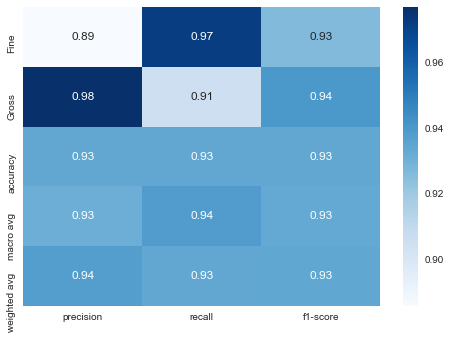

In [30]:
from sklearn.metrics import confusion_matrix, classification_report
#clf_report = classification_report(true,
                              #     pred,
                               ##    labels=labels,
                               #    target_names=target_names,
                               #    output_dict=True)
clf_report = classification_report(vals["activity"], vals["Label"], output_dict=True)
sns.heatmap(pd.DataFrame(clf_report).iloc[:-1, :].T, annot=True, cmap = 'Blues')

In [32]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(y_test, y_pred)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=vals['activity'].unique(), yticklabels=vals['activity'].unique(), cmap='Blues')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

NameError: name 'y_test' is not defined

In [ ]:
px.scatter_matrix(vals,
    dimensions=["avg_result_accl", "sma", "avg_result_accl", "sma_fft", 'Label', 'class', 'Cluster'],
    color="activity", color_discrete_sequence=["red", "green"])

In [ ]:
px.box(val_preds, y= 'avg_result_accl', color = 'activity', title = "Original Classes")

In [ ]:
px.box(vals, y = 'sma', color = "class",color_discrete_sequence=["red", "green", 'blue', 'orange'], title= "Ground Truth")

In [ ]:
px.scatter(vals, y = 'avg_result_accl', color = "Label", color_discrete_sequence=["red",'green'], title = "Predictions")

In [ ]:
vals

In [177]:
import hvplot.pandas
df_min_max_scaled = vals[['sma', 'avg_result_accl', 'sma_fft', 'avg_result_accl_fft']]
for column in df_min_max_scaled.columns:
    df_min_max_scaled[column] = (df_min_max_scaled[column] - df_min_max_scaled[column].min()) / (df_min_max_scaled[column].max() - df_min_max_scaled[column].min())
df_min_max_scaled['activity'] = vals['activity']
gross = df_min_max_scaled[df_min_max_scaled['activity'] == 'Gross']
fine = df_min_max_scaled[df_min_max_scaled['activity'] == 'Fine']

In [178]:
hvplot.andrews_curves(gross, "activity", colormap = 'winter', alpha=0.5, ylim=(-3, 5), title="Gross")

:Overlay
   .Curve.Gross.I            :Curve   [t]   (value)
   .Curve.Gross.II           :Curve   [t]   (value)
   .Curve.Gross.III          :Curve   [t]   (value)
   .Curve.Gross.IV           :Curve   [t]   (value)
   .Curve.Gross.V            :Curve   [t]   (value)
   .Curve.Gross.VI           :Curve   [t]   (value)
   .Curve.Gross.VII          :Curve   [t]   (value)
   .Curve.Gross.VIII         :Curve   [t]   (value)
   .Curve.Gross.IX           :Curve   [t]   (value)
   .Curve.Gross.X            :Curve   [t]   (value)
   .Curve.Gross.XI           :Curve   [t]   (value)
   .Curve.Gross.XII          :Curve   [t]   (value)
   .Curve.Gross.XIII         :Curve   [t]   (value)
   .Curve.Gross.XIV          :Curve   [t]   (value)
   .Curve.Gross.XV           :Curve   [t]   (value)
   .Curve.Gross.XVI          :Curve   [t]   (value)
   .Curve.Gross.XVII         :Curve   [t]   (value)
   .Curve.Gross.XVIII        :Curve   [t]   (value)
   .Curve.Gross.XIX          :Curve   [t]   (value)
   .Curve.Gross.XX           :Curve   [t]   (value)
   .Curve.Gross.XXI          :Curve   [t]   (value)
   .Curve.Gross.XXII         :Curve   [t]   (value)
   .Curve.Gross.XXIII        :Curve   [t]   (value)
   .Curve.Gross.XXIV         :Curve   [t]   (value)
   .Curve.Gross.XXV          :Curve   [t]   (value)
   .Curve.Gross.XXVI         :Curve   [t]   (value)
   .Curve.Gross.XXVII        :Curve   [t]   (value)
   .Curve.Gross.XXVIII       :Curve   [t]   (value)
   .Curve.Gross.XXIX         :Curve   [t]   (value)
   .Curve.Gross.XXX          :Curve   [t]   (value)
   .Curve.Gross.XXXI         :Curve   [t]   (value)
   .Curve.Gross.XXXII        :Curve   [t]   (value)
   .Curve.Gross.XXXIII       :Curve   [t]   (value)
   .Curve.Gross.XXXIV        :Curve   [t]   (value)
   .Curve.Gross.XXXV         :Curve   [t]   (value)
   .Curve.Gross.XXXVI        :Curve   [t]   (value)
   .Curve.Gross.XXXVII       :Curve   [t]   (value)
   .Curve.Gross.XXXVIII      :Curve   [t]   (value)
   .Curve.Gross.XXXIX        :Curve   [t]   (value)
   .Curve.Gross.XL           :Curve   [t]   (value)
   .Curve.Gross.XLI          :Curve   [t]   (value)
   .Curve.Gross.XLII         :Curve   [t]   (value)
   .Curve.Gross.XLIII        :Curve   [t]   (value)
   .Curve.Gross.XLIV         :Curve   [t]   (value)
   .Curve.Gross.XLV          :Curve   [t]   (value)
   .Curve.Gross.XLVI         :Curve   [t]   (value)
   .Curve.Gross.XLVII        :Curve   [t]   (value)
   .Curve.Gross.XLVIII       :Curve   [t]   (value)
   .Curve.Gross.XLIX         :Curve   [t]   (value)
   .Curve.Gross.L            :Curve   [t]   (value)
   .Curve.Gross.LI           :Curve   [t]   (value)
   .Curve.Gross.LII          :Curve   [t]   (value)
   .Curve.Gross.LIII         :Curve   [t]   (value)
   .Curve.Gross.LIV          :Curve   [t]   (value)
   .Curve.Gross.LV           :Curve   [t]   (value)
   .Curve.Gross.LVI          :Curve   [t]   (value)
   .Curve.Gross.LVII         :Curve   [t]   (value)
   .Curve.Gross.LVIII        :Curve   [t]   (value)
   .Curve.Gross.LIX          :Curve   [t]   (value)
   .Curve.Gross.LX           :Curve   [t]   (value)
   .Curve.Gross.LXI          :Curve   [t]   (value)
   .Curve.Gross.LXII         :Curve   [t]   (value)
   .Curve.Gross.LXIII        :Curve   [t]   (value)
   .Curve.Gross.LXIV         :Curve   [t]   (value)
   .Curve.Gross.LXV          :Curve   [t]   (value)
   .Curve.Gross.LXVI         :Curve   [t]   (value)
   .Curve.Gross.LXVII        :Curve   [t]   (value)
   .Curve.Gross.LXVIII       :Curve   [t]   (value)
   .Curve.Gross.LXIX         :Curve   [t]   (value)
   .Curve.Gross.LXX          :Curve   [t]   (value)
   .Curve.Gross.LXXI         :Curve   [t]   (value)
   .Curve.Gross.LXXII        :Curve   [t]   (value)
   .Curve.Gross.LXXIII       :Curve   [t]   (value)
   .Curve.Gross.LXXIV        :Curve   [t]   (value)
   .Curve.Gross.LXXV         :Curve   [t]   (value)
   .Curve.Gross.LXXVI        :Curve   [t]   (value)
   .Curve.Gross.LXXVII       :Curve   [

In [179]:
hvplot.andrews_curves(fine, "activity", colormap = 'winter', alpha=0.5, ylim=(-3, 5), title="Fine")

:Overlay
   .Curve.Fine.I            :Curve   [t]   (value)
   .Curve.Fine.II           :Curve   [t]   (value)
   .Curve.Fine.III          :Curve   [t]   (value)
   .Curve.Fine.IV           :Curve   [t]   (value)
   .Curve.Fine.V            :Curve   [t]   (value)
   .Curve.Fine.VI           :Curve   [t]   (value)
   .Curve.Fine.VII          :Curve   [t]   (value)
   .Curve.Fine.VIII         :Curve   [t]   (value)
   .Curve.Fine.IX           :Curve   [t]   (value)
   .Curve.Fine.X            :Curve   [t]   (value)
   .Curve.Fine.XI           :Curve   [t]   (value)
   .Curve.Fine.XII          :Curve   [t]   (value)
   .Curve.Fine.XIII         :Curve   [t]   (value)
   .Curve.Fine.XIV          :Curve   [t]   (value)
   .Curve.Fine.XV           :Curve   [t]   (value)
   .Curve.Fine.XVI          :Curve   [t]   (value)
   .Curve.Fine.XVII         :Curve   [t]   (value)
   .Curve.Fine.XVIII        :Curve   [t]   (value)
   .Curve.Fine.XIX          :Curve   [t]   (value)
   .Curve.Fine.XX           :Curve   [t]   (value)
   .Curve.Fine.XXI          :Curve   [t]   (value)
   .Curve.Fine.XXII         :Curve   [t]   (value)
   .Curve.Fine.XXIII        :Curve   [t]   (value)
   .Curve.Fine.XXIV         :Curve   [t]   (value)
   .Curve.Fine.XXV          :Curve   [t]   (value)
   .Curve.Fine.XXVI         :Curve   [t]   (value)
   .Curve.Fine.XXVII        :Curve   [t]   (value)
   .Curve.Fine.XXVIII       :Curve   [t]   (value)
   .Curve.Fine.XXIX         :Curve   [t]   (value)
   .Curve.Fine.XXX          :Curve   [t]   (value)
   .Curve.Fine.XXXI         :Curve   [t]   (value)
   .Curve.Fine.XXXII        :Curve   [t]   (value)
   .Curve.Fine.XXXIII       :Curve   [t]   (value)
   .Curve.Fine.XXXIV        :Curve   [t]   (value)
   .Curve.Fine.XXXV         :Curve   [t]   (value)
   .Curve.Fine.XXXVI        :Curve   [t]   (value)
   .Curve.Fine.XXXVII       :Curve   [t]   (value)
   .Curve.Fine.XXXVIII      :Curve   [t]   (value)
   .Curve.Fine.XXXIX        :Curve   [t]   (value)
   .Curve.Fine.XL           :Curve   [t]   (value)
   .Curve.Fine.XLI          :Curve   [t]   (value)
   .Curve.Fine.XLII         :Curve   [t]   (value)
   .Curve.Fine.XLIII        :Curve   [t]   (value)
   .Curve.Fine.XLIV         :Curve   [t]   (value)
   .Curve.Fine.XLV          :Curve   [t]   (value)
   .Curve.Fine.XLVI         :Curve   [t]   (value)
   .Curve.Fine.XLVII        :Curve   [t]   (value)
   .Curve.Fine.XLVIII       :Curve   [t]   (value)
   .Curve.Fine.XLIX         :Curve   [t]   (value)
   .Curve.Fine.L            :Curve   [t]   (value)
   .Curve.Fine.LI           :Curve   [t]   (value)
   .Curve.Fine.LII          :Curve   [t]   (value)
   .Curve.Fine.LIII         :Curve   [t]   (value)
   .Curve.Fine.LIV          :Curve   [t]   (value)
   .Curve.Fine.LV           :Curve   [t]   (value)
   .Curve.Fine.LVI          :Curve   [t]   (value)
   .Curve.Fine.LVII         :Curve   [t]   (value)
   .Curve.Fine.LVIII        :Curve   [t]   (value)
   .Curve.Fine.LIX          :Curve   [t]   (value)
   .Curve.Fine.LX           :Curve   [t]   (value)
   .Curve.Fine.LXI          :Curve   [t]   (value)
   .Curve.Fine.LXII         :Curve   [t]   (value)
   .Curve.Fine.LXIII        :Curve   [t]   (value)
   .Curve.Fine.LXIV         :Curve   [t]   (value)
   .Curve.Fine.LXV          :Curve   [t]   (value)
   .Curve.Fine.LXVI         :Curve   [t]   (value)
   .Curve.Fine.LXVII        :Curve   [t]   (value)
   .Curve.Fine.LXVIII       :Curve   [t]   (value)
   .Curve.Fine.LXIX         :Curve   [t]   (value)
   .Curve.Fine.LXX          :Curve   [t]   (value)
   .Curve.Fine.LXXI         :Curve   [t]   (value)
   .Curve.Fine.LXXII        :Curve   [t]   (value)
   .Curve.Fine.LXXIII       :Curve   [t]   (value)
   .Curve.Fine.LXXIV        :Curve   [t]   (value)
   .Curve.Fine.LXXV         :Curve   [t]   (value)
   .Curve.Fine.LXXVI        :Curve   [t]   (value)
   .Curve.Fine.LXXVII       :Curve   [t]   (value)
   .Curve.Fine.LXXVIII      :Curve   [t]   (value)
   .Curve.Fin